# <u>Model-based control simulation and experimentation</u>
This document consolidates all code to plot the behavior in simulation and experimentation.

# 1. Usefull for code

## 1.1 Imports

In [1]:
# Importing necessary libraries

# Numpy for numerical operations
import numpy as np

# Matplotlib for plotting graphs
import matplotlib.pyplot as plt

# Scipy's integration function
from scipy.integrate import quad

# Scipy's optimization functions
from scipy.optimize import minimize

# Control library for control system functions
import control as ctrl

# Scipy's linear algebra solver
from scipy.linalg import solve

# Scipy's pole placement function
from scipy.signal import place_poles

# Scipy's statistical functions
from scipy import stats

# Pandas for data manipulation and analysis
import pandas as pd

# Seaborn for advanced statistical data visualization
import seaborn as sns

# Scipy's continuous to discrete conversion
from scipy.signal import cont2discrete

# Matplotlib's function formatter
from matplotlib.ticker import FuncFormatter

# Warnings library to suppress specific warning categories
import warnings

# Suppress specific warning categories, in this case, FutureWarning
warnings.filterwarnings('ignore', category=FutureWarning)

/Users/aureliensoenen/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


## 1.2 For plotting

In [2]:
# Define colors for the plots
colors = ['#ED7D31', '#5B9BD5', '#70AD47']  # Orange - Blue - Green

# Labels for the plots
labels = ['Bessel', 'ITAE', 'LQR']

# General formatter function to format y-axis labels as multiples of pi
def multiple_of_pi(x, pos, float_format=True):
    if x == 0:
        return "0"
    elif x == 1:
        return "$\\pi$"
    elif x == -1:
        return "$-\\pi$"
    else:
        if float_format:
            return "${:.1f}\\pi$".format(x)
        else:
            return "${}\\pi$".format(int(x))

def plot_param(control,param, index, axs , color, label, linestyle = "-"):
    sns.lineplot(x=control, y=param[:,index], ax = axs, label=label, color=color, linestyle=linestyle, linewidth=0.75)
    sns.scatterplot(x=control, y=param[:,index], ax = axs, color='dimgray', marker="o", s=4)
    
def plot_segments(param, index1, index2, color, label, linestyle="-", scatter=True, axs=None):
    if scatter:
        sns.scatterplot(x=param[:, index1], y=param[:, index2], ax=axs, color='dimgray', marker="o", s=4)
    
    for i in range(len(param) - 1):
        sns.lineplot(
            x=[param[i, index1], param[i + 1, index1]],
            y=[param[i, index2], param[i + 1, index2]],
            color=color,
            linestyle=linestyle,
            linewidth=0.75,
            label=label if i == 0 else "",
            ax=axs)

# 2. Mathematical model

## 2.1 Mechanical model

In [3]:
# Parameters from Balboa

# Mass and inertia parameters
mp = 0.316  # Body part mass [kg]
mw = 2 * 0.021  # Total mass of both wheels [kg]
l = 23.0 * 1e-3  # Position of center of mass (COM) [m]

Ip = 444.43 * 1e-6  # Inertia of body part [kg*m^2]
Iw = 2 * 26.89 * 1e-6  # Total inertia of both wheels [kg*m^2]

# Physical constants
r = 40 * 1e-3  # Radius of wheel [m]
g = 9.81  # Gravity [m/s^2]

# Weighting matrices
E = np.array([
    [Iw + (mw + mp) * r**2, mp * r * l],
    [mp * r * l, Ip + mp * l**2]
])  # Matrix for second derivatives (d^2/dt^2) of phi and theta

F = np.array([
    [0],
    [-mp * g * l]
])  # Matrix for theta

G = np.array([
    [1],
    [0]
])  # Matrix for input torque

# State-space representation of the system
# State variables: phi, theta, d(phi)/dt, d(theta)/dt
A = np.vstack([
    np.hstack([np.zeros((2, 2)), np.eye(2)]),
    np.hstack([np.zeros((2, 1)), -solve(E, F), np.zeros((2, 2))])
])  # System matrix

B = np.vstack([
    np.zeros((2, 1)),
    solve(E, G)
])  # Input matrix

C = np.array([
    [1, 0, 0, 0],
    [0, 1, 0, 0],
    [0, 0, 1, 0],
    [0, 0, 0, 1]
])  # Output matrix

D = np.array([
    [0],
    [0],
    [0],
    [0]
])  # Feedforward matrix

# Create the state-space system
sys1 = ctrl.ss(A, B, C, D)

## 2.2 Electrical model

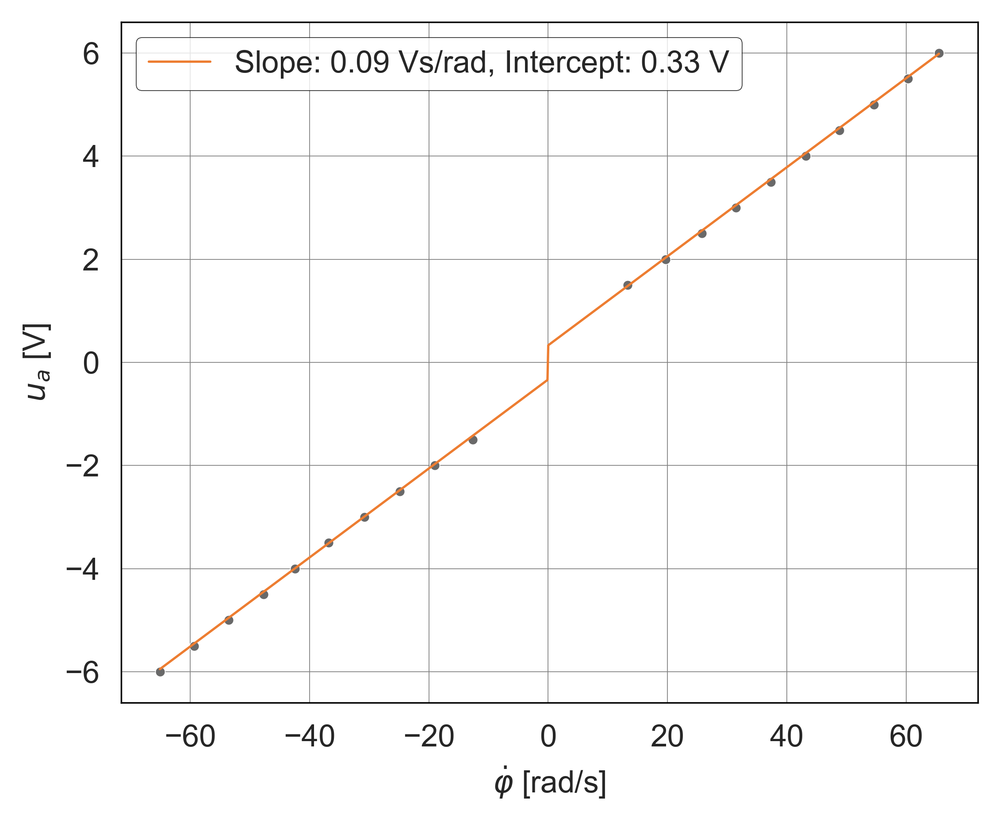

In [4]:
# Define data points for ua and omega
ua = np.concatenate((np.arange(1.5, 6.5, 0.5), np.arange(-1.5, -6.5, -0.5)), axis=None)
omega = np.array([13.31, 19.69, 25.80, 31.46, 37.33, 43.18, 48.82, 54.64, 60.30, 65.52, -12.61, -19.01, -24.86, -30.80, -36.79, -42.48, -47.74, -53.57, -59.39, -65.11])

# Perform linear regression on positive and negative omega values
slope1, intercept1, *_ = stats.linregress(omega[:10], ua[:10])
slope2, intercept2, *_ = stats.linregress(omega[10:], ua[10:])

# Average slope and intercept
slope = (slope1 + slope2) / 2
intercept = (intercept1 - intercept2) / 2

# Generate data for linear fit line
x = np.linspace(min(omega), max(omega), 1000)

# Plotting setup
plt.figure(figsize=(5, 4), dpi=500)
sns.set_style("whitegrid")

# Plot the linear fit line and scatter points
sns.lineplot(x=x, y=x * slope + intercept * np.sign(x), color='#ED7D31', linestyle="-", linewidth=0.75)
sns.scatterplot(x=omega, y=ua, color='dimgray', marker="o", s=10)

# Customizing axes and plot border
ax = plt.gca()  # Get current axis
for spine in ax.spines.values():
    spine.set_linewidth(0.5)
    spine.set_color('black')  # Set spines color to black
    
# Customize legend
legend_text = f"Slope: {slope:.1g} Vs/rad, Intercept: {intercept:.2g} V"
legend = plt.legend([legend_text], frameon=True)
legend_frame = legend.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Setting the style for grid lines
plt.grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
plt.minorticks_on()  # Turn on minor ticks

# Axis labels
plt.xlabel("$\\dot{\\varphi}$ [rad/s]")
plt.ylabel("$u_a$ [V]")

# Save and show plot
plt.savefig("plot/motorParam.png", bbox_inches='tight')  
plt.show()

In [5]:
# Define constants
a = 7.5
b = 0.09
c = 0.4

# Create modified copies of A and B matrices
A_prime = A.copy()  # Copy of the system matrix A
B_prime = B / a     # Scaled input matrix B

# Define sampling time (Ts) - assuming Ts is defined earlier in the notebook
Ts = 0.01  # Example value, adjust as necessary

# Convert continuous system to discrete system using Zero-Order Hold (ZOH) method
A_dt, B_dt, _, _, _ = cont2discrete((A_prime, B_prime, C, D), Ts, method='zoh')


# 3. Controller design

## 3.1 Linear-QuadraticRegulator (LQR)

In [6]:
# Initialize optimal LQR gain
K_LQR_opt = 0

# Define a range of costs
costs = 2**np.arange(1, 5, 1)

# Loop through each cost to calculate LQR gain
for cost in costs:
    
    # Define Q and R matrices for LQR
    Q = np.array([
        [1, 0, 0, 0],                          
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]
    ])
    R = cost**2

    # Calculate LQR gain K_LQR
    K_LQR, S, P = ctrl.lqr(A_prime, B_prime, Q, R)

    # Store the optimal LQR gain for a specific cost
    if cost == 8:
        K_LQR_opt = K_LQR

    # Print the LQR gain in LaTeX table format
    Kprint = K_LQR[0]
    print('\t{} & [ \\begin{{tblr}}{{cccc}}{:.2g} & {:.2g} & {:.2g} & {:.2g}\\end{{tblr}}] \\\\'.format(
        cost, Kprint[0], Kprint[1], Kprint[2], Kprint[3]
    ))

	2 & [ \begin{tblr}{cccc}-0.5 & -7.1 & -0.16 & -0.63\end{tblr}] \\
	4 & [ \begin{tblr}{cccc}-0.25 & -5.3 & -0.091 & -0.46\end{tblr}] \\
	8 & [ \begin{tblr}{cccc}-0.13 & -4.2 & -0.055 & -0.36\end{tblr}] \\
	16 & [ \begin{tblr}{cccc}-0.062 & -3.5 & -0.035 & -0.3\end{tblr}] \\


## 3.2 Pole placement methods: Bessel and ITAE

In [7]:
# Initialize optimal feedback gains
K_bessel_opt = 0
K_itae_opt = 0

# Loop through different time scalings
for i in [0.8, 0.9, 1, 1.1]:
    ts = i  # Time scaling factor

    # Define the roots for Bessel and ITAE
    bessel = np.array([-4.016 + 5.072j, -4.016 - 5.072j, -5.528 + 1.655j, -5.528 - 1.655j]) / ts
    itae = np.array([-4.236 + 12.617j, -4.236 - 12.617j, -6.254 + 4.139j, -6.254 - 4.139j]) / ts

    # Calculate feedback gains using pole placement
    K_bessel = ctrl.place(A_prime, B_prime, bessel)
    K_itae = ctrl.place(A_prime, B_prime, itae)
    
    # Store the optimal feedback gains for time scaling factor of 1
    if ts == 1:
        K_bessel_opt = K_bessel
        K_itae_opt = K_itae

    # Extract the first row of gains for printing
    K_bessel = K_bessel[0]
    K_itae = K_itae[0]

    # Print the feedback gains in LaTeX table format
    print('\t{} s & [\\begin{{tblr}}{{cccc}}{:.2g} & {:.2g} & {:.2g} & {:.2g}\\end{{tblr}}] & [\\begin{{tblr}}{{cccc}}{:.2g} & {:.2g} & {:.2g} & {:.2g}\\end{{tblr}}] \\\\'.format(
        ts, K_bessel[0], K_bessel[1], K_bessel[2], K_bessel[3], K_itae[0], K_itae[1], K_itae[2], K_itae[3]
    ))

	0.8 s & [\begin{tblr}{cccc}-0.11 & -3.4 & -0.045 & -0.28\end{tblr}] & [\begin{tblr}{cccc}-0.76 & -6.8 & -0.17 & -0.55\end{tblr}] \\
	0.9 s & [\begin{tblr}{cccc}-0.067 & -2.9 & -0.031 & -0.23\end{tblr}] & [\begin{tblr}{cccc}-0.48 & -5.4 & -0.12 & -0.42\end{tblr}] \\
	1 s & [\begin{tblr}{cccc}-0.044 & -2.5 & -0.023 & -0.2\end{tblr}] & [\begin{tblr}{cccc}-0.31 & -4.4 & -0.085 & -0.34\end{tblr}] \\
	1.1 s & [\begin{tblr}{cccc}-0.03 & -2.3 & -0.017 & -0.17\end{tblr}] & [\begin{tblr}{cccc}-0.21 & -3.8 & -0.064 & -0.28\end{tblr}] \\


# 4. Numerical simulation

In [8]:
def calculate_stabilization_parameters(t, x, u, r):
    T1 = t[-1]  # Final time
    dt = t[1] - t[0]  # Time step

    # Mean absolute voltage
    ua_mean = np.mean(np.abs(u))

    # Mean wheel position error
    phi = x[:, 0]
    phi_error = np.mean(phi - r)

    # Standard deviation of wheel position
    phi_std = np.sqrt(np.mean((phi - r - phi_error)**2))

    # Standard deviation of angular position
    theta = x[:, 1]
    theta_std = np.sqrt(np.mean(theta**2))
    
    return ua_mean, abs(phi_error), phi_std, theta_std

def calculate_stabilization_parameters_experiment(t, phi, theta, u, r):
    # Mean absolute voltage
    ua_mean = np.mean(np.abs(u))

    # Mean wheel position error
    phi_error = np.mean(phi - r)

    # Standard deviation of wheel position
    phi_std = np.sqrt(np.mean((phi - r - phi_error)**2))

    # Standard deviation of angular position
    theta_std = np.sqrt(np.mean(theta**2))

    return ua_mean, abs(phi_error)*180/np.pi, phi_std*180/np.pi, theta_std*180/np.pi

In [9]:
def ref(t):
    r = np.zeros_like(t)

    # Define segments
    rise_start, rise_end = 10, 15
    fall_start, fall_end = 25, 30

    # Calculate indices
    rise_indices = (t >= rise_start) & (t <= rise_end)
    fall_indices = (t >= fall_start) & (t <= fall_end)

    # Interpolate values for rise
    r[rise_indices] = np.linspace(0, 4*np.pi, rise_indices.sum())
    # Maintain the height of 4*pi between rise end and fall start
    r[(t > rise_end) & (t < fall_start)] = 4*np.pi
    # Interpolate values for fall
    r[fall_indices] = np.linspace(4*np.pi, 0, fall_indices.sum())

    return r

In [10]:
def SystemResponse(K, mode='initial', Tmax=1.25, returnParam = False, noise_factor = 0.0, offset = True):
    fs = 100
    np.random.seed(10)
    
    samples = int(Tmax * fs)
    T = np.linspace(0, Tmax, samples)
    x = np.zeros((samples, 4))
    u = np.zeros(samples)
    angle = 10 / 180 * np.pi
    
    if mode == 'initial':
        x[0] = [0, -angle, 0, 0.0]
        ref_signal = np.zeros_like(T)
    elif mode == 'proportional':
        x[0] = [0, angle, 0, 0.0]
        ref_signal = ref(T)
    elif mode == 'noise':
        x[0] = [0, angle, 0, 0.0]
        ref_signal = ref(T)
    else:
        raise ValueError("Invalid mode. Choose 'initial' or 'proportional'.")

    for i in range(len(T) - 1):
        u[i] = -K @ (x[i] - [ref_signal[i], 0, 0, 0])
        u[i] = np.clip(u[i], -6, 6)  # Clip u to be within [-6, 6]
        noise = noise_factor * np.random.randn(4)
        x[i+1] = A_dt @ x[i] + B_dt.T[0] * u[i] + noise
        x[i+1][1] = np.clip(x[i+1][1], -np.pi/2, np.pi/2)  # Clip x[1] to be within [-π/2, π/2]
    
    u = u - x @ [0, 0, b, 0]
    if offset:
        u = u + np.sign(u) * c
    ua_mean, phi_error, phi_std, theta_std = calculate_stabilization_parameters(T, x, u, ref_signal)
    if returnParam:
        return np.array([ua_mean+c, phi_error*180/np.pi, phi_std*180/np.pi, theta_std*180/np.pi])
    return T, x, u, ref_signal

## 4.1 System dynamics

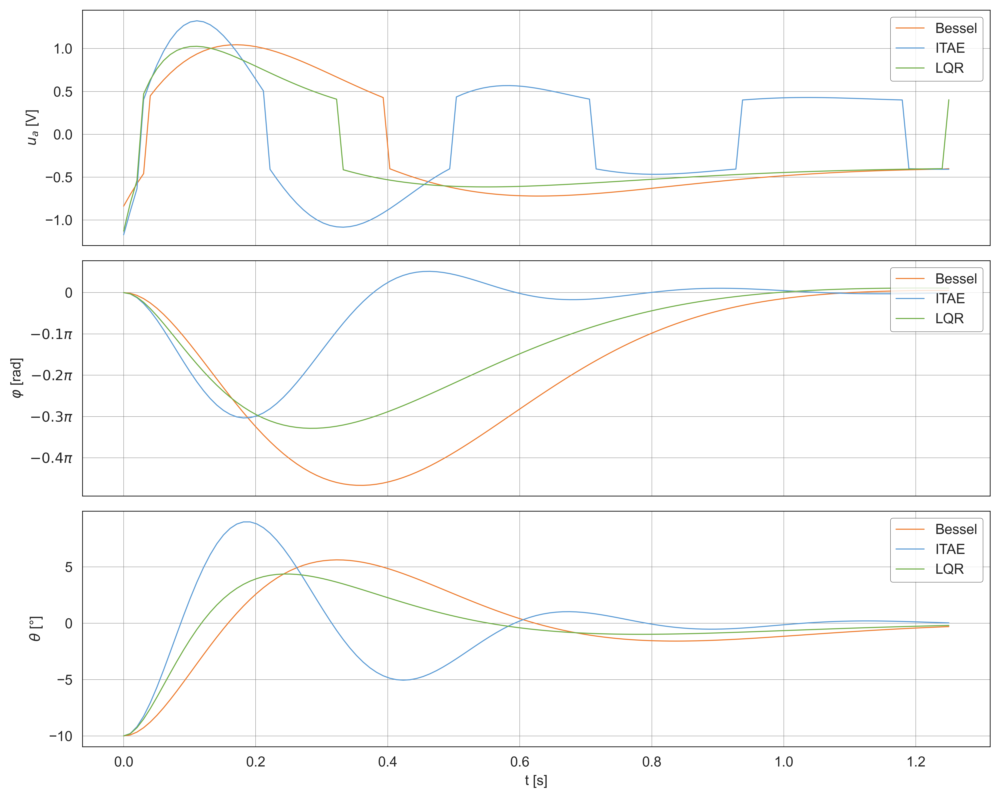

In [11]:
# Generate system responses for Bessel, ITAE, and LQR controllers
responses = {
    'Bessel': SystemResponse(K_bessel_opt),
    'ITAE': SystemResponse(K_itae_opt),
    'LQR': SystemResponse(K_LQR_opt)
}

# Create a new figure with 3 subplots
fig, axs = plt.subplots(3, 1, figsize=(10, 8), sharex=True, dpi=500)


# Plot the control input 'u_a' for each controller
for idx, (name, (t, x, u, *_)) in enumerate(responses.items()):
    axs[0].plot(t, u, label=labels[idx], color=colors[idx], linewidth=0.75)
axs[0].set_ylabel('$u_a$ [V]')
axs[0].legend()

# Plot the wheel position 'phi' for each controller
for idx, (name, (t, x, u, *_)) in enumerate(responses.items()):
    axs[1].plot(t, x[:, 0] / np.pi, label=labels[idx], color=colors[idx], linewidth=0.75)
axs[1].set_ylabel('$\\varphi$ [rad]')
axs[1].legend()
axs[1].yaxis.set_major_formatter(FuncFormatter(multiple_of_pi))

# Plot the angular position 'theta' for each controller
for idx, (name, (t, x, u, *_)) in enumerate(responses.items()):
    axs[2].plot(t, x[:, 1] * 180 / np.pi, label=labels[idx], color=colors[idx], linewidth=0.75)
axs[2].set_ylabel('$\\theta$ [°]')
axs[2].legend()

# Set x-axis label
axs[2].set_xlabel('t [s]')

# Customizing plot borders and other settings for each subplot
for ax in axs:
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
    # Customize legend
    legend = ax.legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)  # Change the box's border width

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig("plot/InitialResponse.png", bbox_inches='tight')
plt.show()

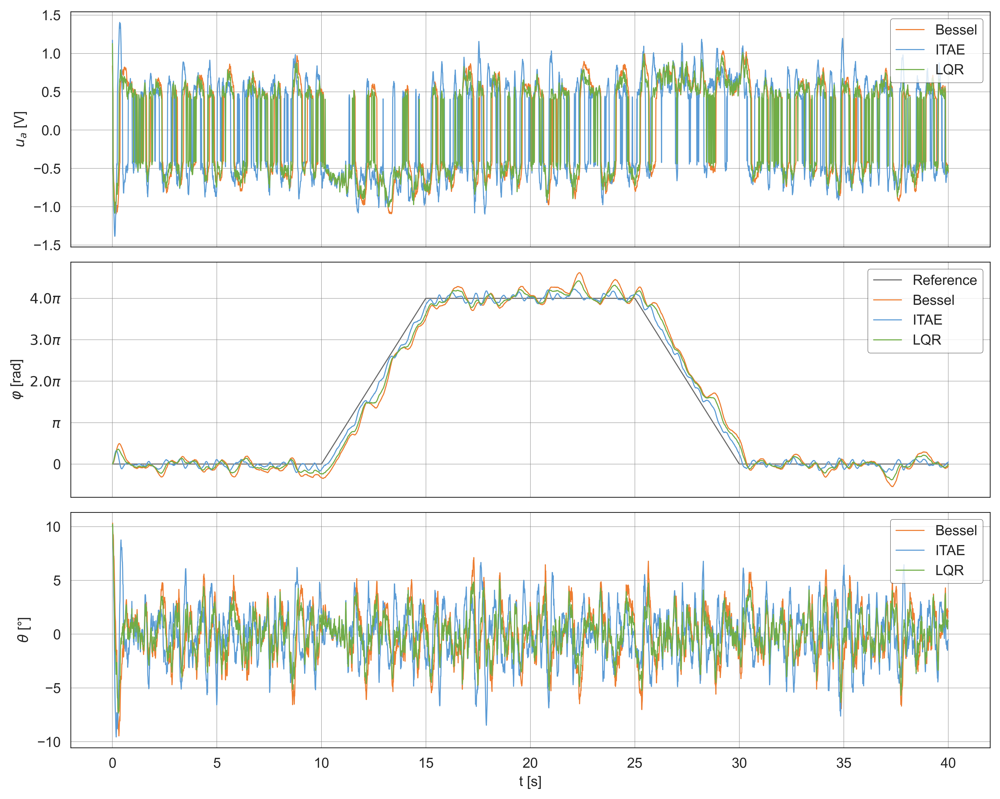

In [12]:
# Generate system responses for Bessel, ITAE, and LQR controllers
responses = {
    'Bessel': SystemResponse(K_bessel_opt, mode='proportional', Tmax=40, noise_factor = 0.01),
    'ITAE': SystemResponse(K_itae_opt, mode='proportional', Tmax=40, noise_factor = 0.01),
    'LQR': SystemResponse(K_LQR_opt, mode='proportional', Tmax=40, noise_factor = 0.01)
}

# Extract the reference signal
t, x_bessel, u_bessel, r = responses['Bessel']

# Create a new figure with 3 subplots
fig, axs = plt.subplots(3, 1, figsize=(10, 8), sharex=True, dpi=500)

# Plot the control input 'u_a' for each controller
for idx, (name, (t, x, u, *_)) in enumerate(responses.items()):
    axs[0].plot(t, u, label=labels[idx], color=colors[idx], linewidth=0.75)
axs[0].set_ylabel('$u_a$ [V]')
axs[0].legend()

# Plot the wheel position 'phi' for each controller and the reference signal
axs[1].plot(t, r / np.pi, label='Reference', color='dimgray', linewidth=0.75)
for idx, (name, (t, x, u, *_)) in enumerate(responses.items()):
    axs[1].plot(t, x[:, 0] / np.pi, label=labels[idx], color=colors[idx], linewidth=0.75)
axs[1].set_ylabel('$\\varphi$ [rad]')
axs[1].legend()
axs[1].yaxis.set_major_formatter(FuncFormatter(multiple_of_pi))

# Plot the angular position 'theta' for each controller
for idx, (name, (t, x, u, *_)) in enumerate(responses.items()):
    axs[2].plot(t, x[:, 1] * 180 / np.pi, label=labels[idx], color=colors[idx], linewidth=0.75)
axs[2].set_ylabel('$\\theta$ [°]')
axs[2].legend()

# Set x-axis label
axs[2].set_xlabel('t [s]')

# Customizing plot borders and other settings for each subplot
for ax in axs:
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
    # Customize legend
    legend = ax.legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)  # Change the box's border width

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig("plot/propRefTrack.png", bbox_inches='tight')
plt.show()

## 4.2 Feedback performance

In [13]:
# Define metrics for the subplots
metrics = ['$\overline{u}_{a}$ $[V]$', '$|\\epsilon_{\\varphi}|$ [°]', '$\\sigma_{\\varphi}$ [°]', '$\\sigma_{\\theta}$ [°]']

In [14]:
# Initialize lists to store feedback gains
K_bessels = []
K_itaes = []

# Time scalings for ITAE and Bessel
tsitae = np.linspace(0.6, 1.9, 50)
tsbessel = np.linspace(0.3, 1.2, 50)

# Loop through each time scaling factor to calculate feedback gains
for i in range(len(tsitae)):
    # Define the roots for Bessel and ITAE
    bessel = np.array([-4.016 + 5.072j, -4.016 - 5.072j, -5.528 + 1.655j, -5.528 - 1.655j]) / tsbessel[i]
    itae = np.array([-4.236 + 12.617j, -4.236 - 12.617j, -6.254 + 4.139j, -6.254 - 4.139j]) / tsitae[i]

    # Calculate feedback gains using pole placement
    K_bessel = ctrl.place(A_prime, B_prime, bessel)
    K_itae = ctrl.place(A_prime, B_prime, itae)
    
    # Store the feedback gains
    K_bessels.append(K_bessel[0])
    K_itaes.append(K_itae[0])

# Initialize arrays to store parameters from reference tracking
param_bessel = np.zeros((len(tsitae), 4))
param_itae = np.zeros((len(tsitae), 4))

# Calculate parameters for each feedback gain
for i in range(len(tsitae)):
    param_bessel[i] = SystemResponse(K_bessels[i], mode='proportional', Tmax=40, returnParam = True, noise_factor = 0.01)
    param_itae[i] = SystemResponse(K_itaes[i], mode='proportional', Tmax=40, returnParam = True, noise_factor = 0.01)

In [15]:
# Initialize lists to store feedback gains
K_LQRs = []

# Define the range of costs
costs = np.linspace(0.25, 15, 50)

# Loop through each cost to calculate LQR feedback gains
for cost in costs:
    # Define Q and R matrices for LQR
    Q = np.array([
        [1, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]
    ])
    R = cost**2

    # Calculate LQR feedback gain
    K_LQR, S, P = ctrl.lqr(A_prime, B_prime, Q, R)
    
    # Store the feedback gain
    K_LQRs.append(K_LQR[0])

# Initialize array to store parameters from system response
param_LQR = np.zeros((len(costs), 4))

# Calculate parameters for each LQR feedback gain
for i in range(len(costs)):
    param_LQR[i] = SystemResponse(K_LQRs[i], mode='proportional', Tmax=40, returnParam = True, noise_factor = 0.01)

In [16]:
def findBest(param,index1,index2,factor1,factor2):
    best = np.inf
    bestCoord = 0
    for i in range(len(param)):
        if np.sqrt((param[i,index1]/factor1)**2 + (param[i,index2]/factor2)**2) < best:
            best = np.sqrt((param[i,index1]/factor1)**2 + (param[i,index2]/factor2)**2)
            bestCoord = i
    return bestCoord

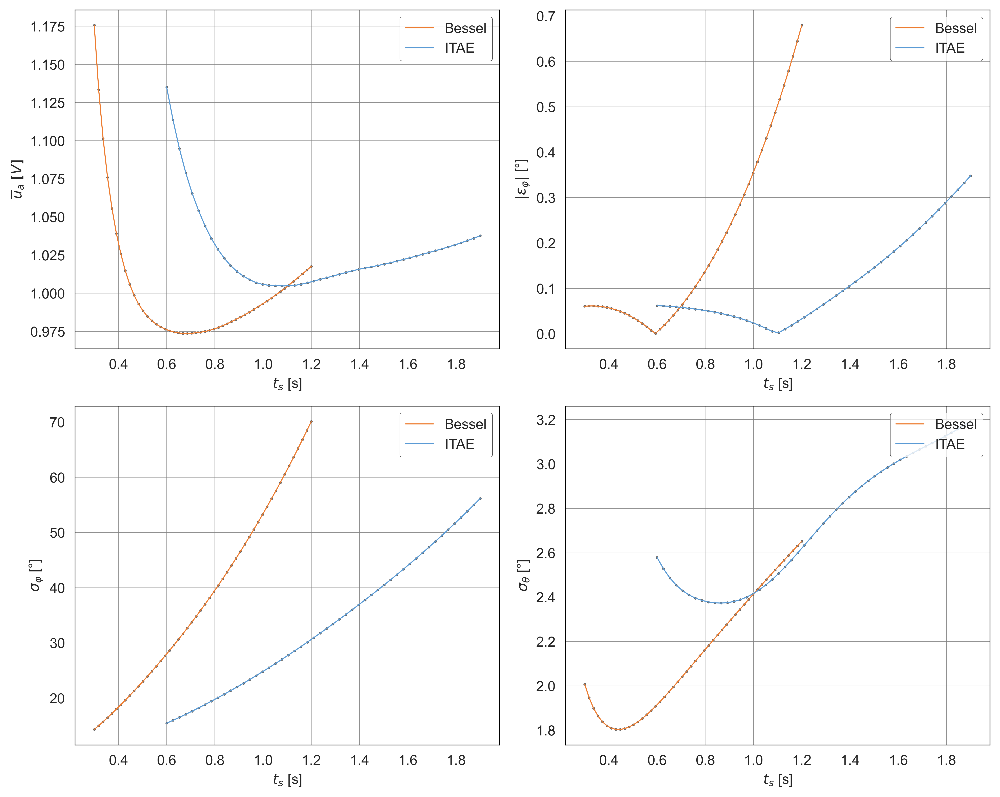

In [17]:
# Create a figure with 2x2 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=500)
sns.set_style("whitegrid")


# Plot each parameter on a separate subplot
for i in range(4):
    row, col = divmod(i, 2)
    plot_param(tsbessel,param_bessel, i, axs[row, col] , colors[0], labels[0], linestyle = "-")
    plot_param(tsitae,param_itae, i, axs[row, col] , colors[1], labels[1], linestyle = "-")
    
    # Customizing axes and plot border
    for spine in axs[row, col].spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')  # Set spines color to black
    
    # Customize legend
    legend = axs[row, col].legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)      # Change the box's border width
    
    # Setting the style for grid lines
    axs[row, col].grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
    axs[row, col].minorticks_on()  # Turn on minor ticks

    axs[row, col].set_xlabel("$t_{s}$ [s]")
    axs[row, col].set_ylabel(metrics[i])

# Adjust layout
plt.tight_layout()

# Save and show plot
plt.savefig("plot/propRefTrackts.png", bbox_inches='tight')  
plt.show()

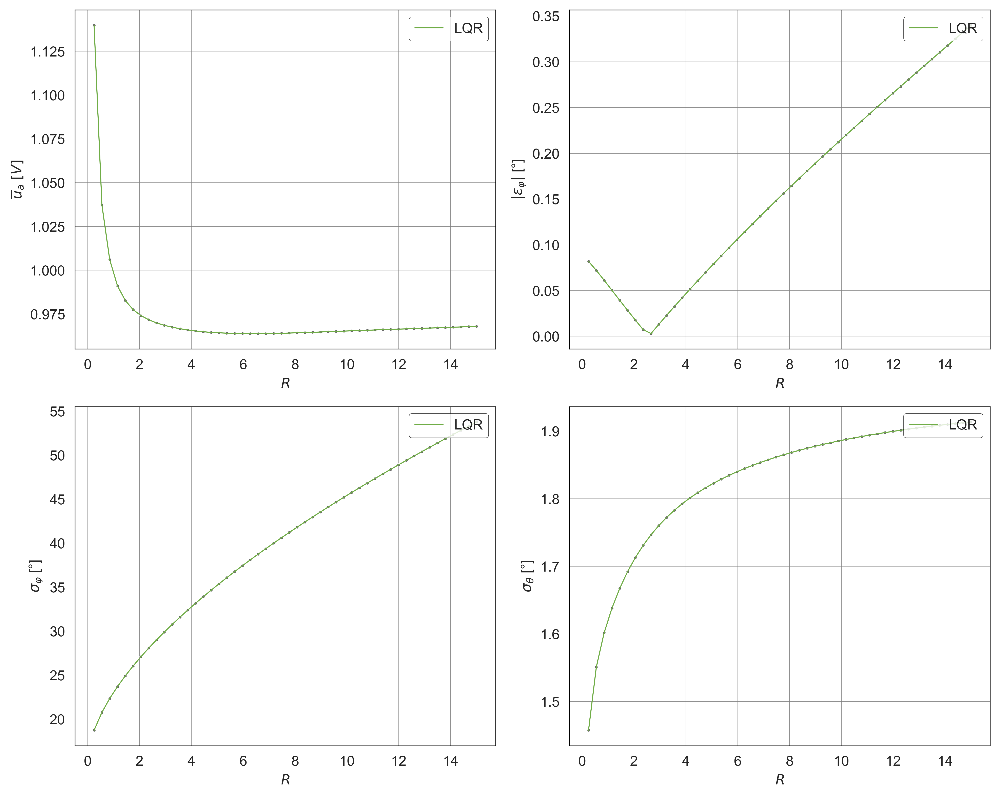

In [18]:
# Create a figure with 2x2 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=500)
sns.set_style("whitegrid")

# Plot each parameter on a separate subplot
for i in range(4):
    row, col = divmod(i, 2)
    plot_param(costs,param_LQR, i, axs[row, col] , colors[2], labels[2], linestyle = "-")

    # Customizing axes and plot border
    for spine in axs[row, col].spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')  # Set spines color to black
    
    # Customize legend
    legend = axs[row, col].legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)      # Change the box's border width
    
    # Setting the style for grid lines
    axs[row, col].grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
    axs[row, col].minorticks_on()  # Turn on minor ticks

    axs[row, col].set_xlabel("$R$")
    axs[row, col].set_ylabel(metrics[i])

# Adjust layout
plt.tight_layout()

# Save and show plot
plt.savefig("plot/propRefTrackR.png", bbox_inches='tight')  
plt.show()

0.63 & 1.1 & 3.3 \\
0.61 & 1 & 3.3 \\
0.65 & 1 & 5.7 \\


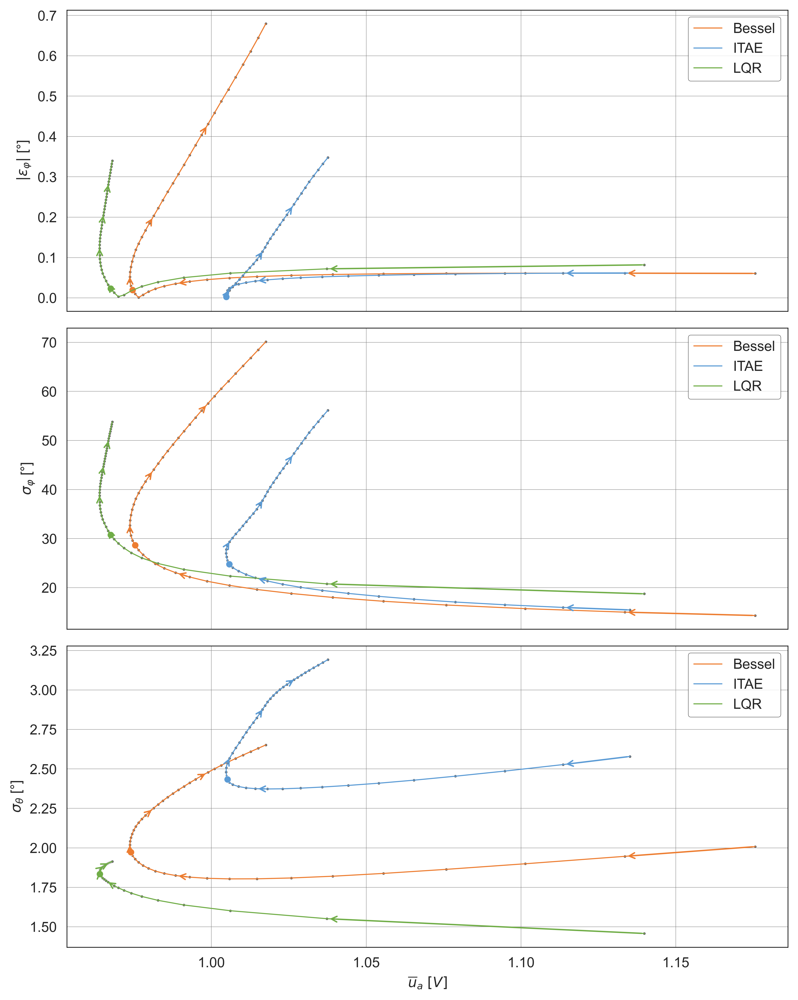

In [19]:
# Define the indices, factors, and labels for the plots
plot_settings = [
    {'index1': 0, 'index2': 1, 'factor1': 0.7, 'factor2': 0.3},
    {'index1': 0, 'index2': 2, 'factor1': 0.3, 'factor2': 50},
    {'index1': 0, 'index2': 3, 'factor1': 0.3, 'factor2': 3}
]

# Parameters
params = [param_bessel, param_itae, param_LQR]

# Create a new figure with 3 subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 10), sharex=True, dpi=500)
sSize = 25

# Plotting loop
for i, setting in enumerate(plot_settings):
    index1 = setting['index1']
    index2 = setting['index2']
    factor1 = setting['factor1']
    factor2 = setting['factor2']
    
    # Plot segmented lines
    for param, color, label in zip(params, colors, labels):
        plot_segments(param, index1, index2, color, label, axs = axs[i])
        
    # Find best coordinates
    best_coords = [findBest(param, index1, index2, factor1, factor2) for param in params]
    
    # Plot best coordinates
    for param, best, color in zip(params, best_coords, colors):
        sns.scatterplot(x=[param[best, index1]], y=[param[best, index2]], ax=axs[i], marker="o", s=sSize, color=color)
        
    # Print best parameters
    print('{:.2g} & {:.2g} & {:.2g} \\\\'.format(tsbessel[best_coords[0]], tsitae[best_coords[1]], costs[best_coords[2]]))
    
    # Add arrows to the plot
    for param, color in zip(params, colors):
        for j in range(1, len(param), len(param) // 5):
            axs[i].annotate('', xy=(param[j, index1], param[j, index2]), xytext=(param[j-1, index1], param[j-1, index2]), arrowprops=dict(arrowstyle="->", color=color))
    
    # Set labels and legend
    axs[i].set_ylabel(metrics[index2])
    axs[i].legend()

# Set the x-axis label for the last subplot
axs[-1].set_xlabel(metrics[plot_settings[-1]['index1']])

# Customizing plot borders and other settings for each subplot
for ax in axs:
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
    # Customize legend
    legend = ax.legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)  # Change the box's border width

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig("plot/SimuOpti.png", bbox_inches='tight')
plt.show()

## 4.3 System noise

In [20]:
# Time scaling factors
tsitae = 1
tsbessel = 0.6

# Define the roots for Bessel and ITAE
bessel = np.array([-4.016 + 5.072j, -4.016 - 5.072j, -5.528 + 1.655j, -5.528 - 1.655j]) / tsbessel
itae = np.array([-4.236 + 12.617j, -4.236 - 12.617j, -6.254 + 4.139j, -6.254 - 4.139j]) / tsitae

# Calculate feedback gains using pole placement
K_bessel = ctrl.place(A_prime, B_prime, bessel)[0]
K_itae = ctrl.place(A_prime, B_prime, itae)[0]

# Define cost for LQR
cost = 3

# Define Q and R matrices for LQR
Q = np.array([
    [1, 0, 0, 0],                          
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0]
])
R = cost**2

# Calculate LQR feedback gain
K_LQR, S, P = ctrl.lqr(A_prime, B_prime, Q, R)
K_LQR = K_LQR[0]

In [21]:
# Define noise levels
noise = np.linspace(0.00, 0.05, 50)

# Initialize arrays to store parameters for Bessel, ITAE, and LQR with noise
param_bessel_noise = np.zeros((len(noise), 4))
param_itae_noise = np.zeros((len(noise), 4))
param_LQR_noise = np.zeros((len(noise), 4))

# Evaluate system response with varying noise levels
for i, noise_level in enumerate(noise):
    param_bessel_noise[i] = SystemResponse(K_bessel, mode='noise', Tmax=40, returnParam=True, noise_factor=noise_level)
    param_itae_noise[i] = SystemResponse(K_itae, mode='noise', Tmax=40, returnParam=True, noise_factor=noise_level)
    param_LQR_noise[i] = SystemResponse(K_LQR, mode='noise', Tmax=40, returnParam=True, noise_factor=noise_level)

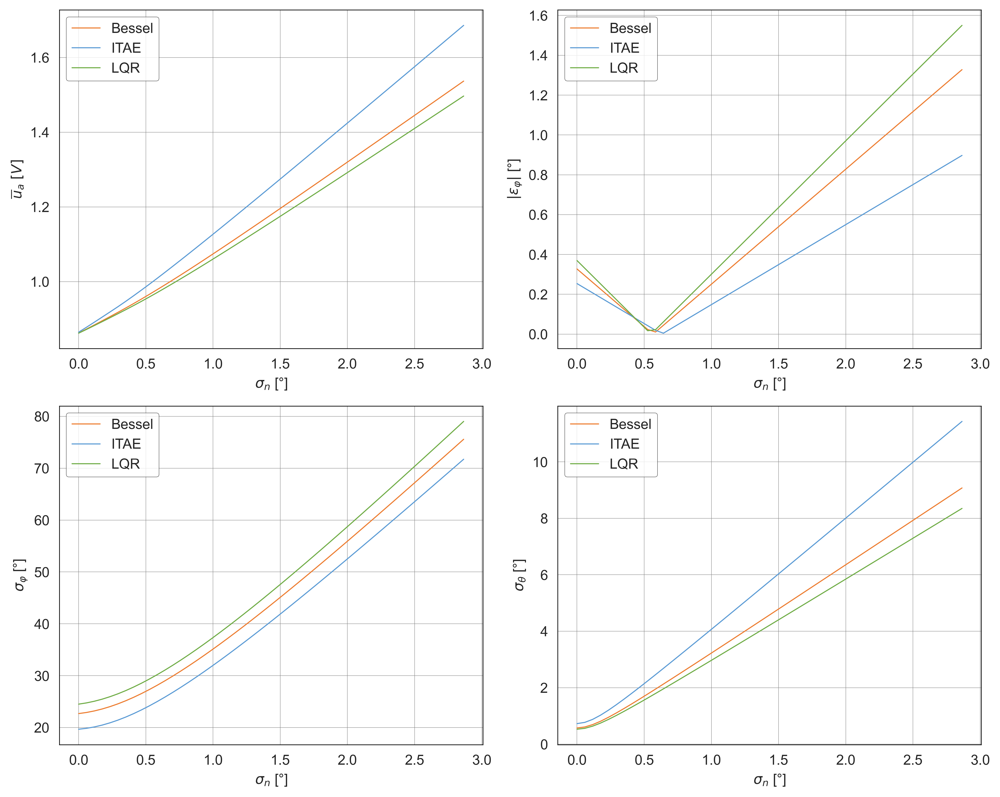

In [22]:
# Create a figure with 2x2 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=500)
sns.set_style("whitegrid")

# Plot each parameter on a separate subplot
for i in range(4):
    row, col = divmod(i, 2)
    sns.lineplot(x=noise*180/np.pi, y=param_bessel_noise[:,i], ax=axs[row, col], label=labels[0], color=colors[0], linestyle="-", linewidth=0.75)
    sns.lineplot(x=noise*180/np.pi, y=param_itae_noise[:,i], ax=axs[row, col], label=labels[1], color=colors[1], linestyle="-", linewidth=0.75)
    sns.lineplot(x=noise*180/np.pi, y=param_LQR_noise[:,i], ax=axs[row, col], label=labels[2], color=colors[2], linestyle="-", linewidth=0.75)

    # Customizing axes and plot border
    for spine in axs[row, col].spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')  # Set spines color to black
    
    # Customize legend
    legend = axs[row, col].legend(frameon=True)
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)      # Change the box's border width
    
    # Setting the style for grid lines
    axs[row, col].grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
    axs[row, col].minorticks_on()  # Turn on minor ticks

    axs[row, col].set_xlabel("$\\sigma_{n}$ [°]")
    axs[row, col].set_ylabel(metrics[i])

# Adjust layout
plt.tight_layout()

# Save and show plot
plt.savefig("plot/noiseAnalysesRefTrack.png", bbox_inches='tight')  
plt.show()

# 5. Experimentation

## 5.1 System dynamics

	Bessel & 0.82 V & 133.0\degree & 37\degree & 9.2\degree\\
	ITAE & 0.78 V & 28.1\degree & 48\degree & 4.8\degree\\
	LQR & 0.92 V & 37.2\degree & 77\degree & 6.5\degree\\


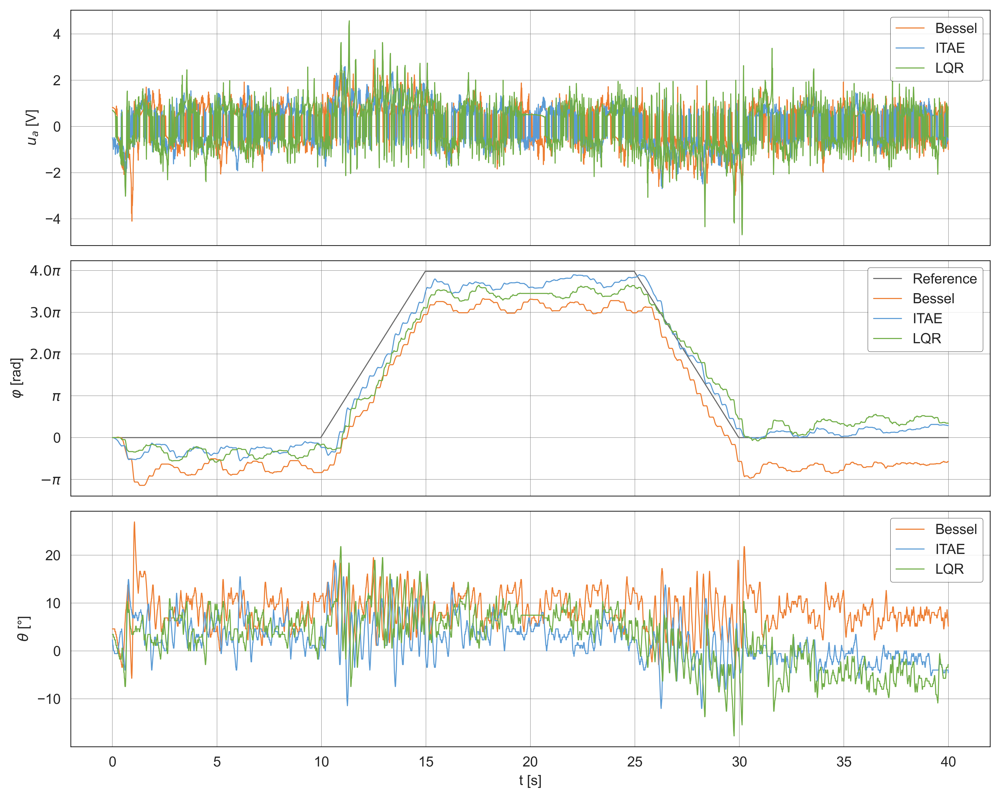

In [23]:
# Define the column names for the data files
colnames = ['time', 'phi', 'theta', 'phi_dot', 'theta_dot', 'ua', 'ref', 'ts'] 

# Function to process data and calculate stabilization parameters
def process_data(file_name, label):
    df = pd.read_csv(file_name, names=colnames, header=1)
    df.time -= df.time[0]
    df = df[df.time < 40000]
    df.time /= 1000
    x = np.array([df.phi, df.theta, df.phi_dot, df.theta_dot])
    u = df.ua
    ua_mean, phi_error, phi_std, theta_std = calculate_stabilization_parameters_experiment(df.time, df.phi, df.theta, df.ua, df.ref)
    print("\t{} & {:.2g} V & {:.1f}\\degree & {:.2g}\\degree & {:.2g}\\degree\\\\".format(label, ua_mean, phi_error, phi_std, theta_std))
    return df.time, x, df.ref, u

# Process data for Bessel, ITAE, and LQR controllers
files = ["data/BestBessel.txt", "data/BestITAE.txt", "data/BestLQR.txt"]
results = {label: process_data(file, label) for file, label in zip(files, labels)}

# Extract data from results
t = results['Bessel'][0]
r = results['Bessel'][2]

# Create a new figure with 3 subplots
fig, axs = plt.subplots(3, 1, figsize=(10, 8), sharex=True, dpi=500)

# Plot control input 'u_a' for each controller
for label, color in zip(labels, colors):
    axs[0].plot(t, results[label][3], label=label, color=color, linewidth=0.75)
axs[0].set_ylabel('$u_a$ [V]')
axs[0].legend()

# Plot wheel position 'phi' for each controller and the reference signal
axs[1].plot(t, r / np.pi, label='Reference', color='dimgray', linewidth=0.75)
for label, color in zip(labels, colors):
    axs[1].plot(t, results[label][1][0] / np.pi, label=label, color=color, linewidth=0.75)
axs[1].set_ylabel('$\\varphi$ [rad]')
axs[1].legend()
axs[1].yaxis.set_major_formatter(FuncFormatter(multiple_of_pi))

# Plot angular position 'theta' for each controller
for label, color in zip(labels, colors):
    axs[2].plot(t, results[label][1][1] * 180 / np.pi, label=label, color=color, linewidth=0.75)
axs[2].set_ylabel('$\\theta$ [°]')
axs[2].legend()

# Set x-axis label
axs[2].set_xlabel('t [s]')

# Customizing plot borders and other settings for each subplot
for ax in axs:
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
    # Customize legend
    legend = ax.legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)  # Change the box's border width

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig("plot/propRefTrack_exp.png", bbox_inches='tight')
plt.show()

## 5.2 Feedback performance

In [24]:
# Set noise factor
noise_factor = 0.025

# Initialize lists to store feedback gains
K_bessels = []
K_itaes = []

# Define time scaling factors
tsitae = np.linspace(0.5, 1.75, 25)
tsbessel = np.linspace(0.3, 1.2, 25)

# Calculate feedback gains for each time scaling factor
for ts_b, ts_i in zip(tsbessel, tsitae):
    # Define the roots for Bessel and ITAE
    bessel = np.array([-4.016 + 5.072j, -4.016 - 5.072j, -5.528 + 1.655j, -5.528 - 1.655j]) / ts_b
    itae = np.array([-4.236 + 12.617j, -4.236 - 12.617j, -6.254 + 4.139j, -6.254 - 4.139j]) / ts_i

    # Calculate feedback gains using pole placement
    K_bessels.append(ctrl.place(A_prime, B_prime, bessel)[0])
    K_itaes.append(ctrl.place(A_prime, B_prime, itae)[0])

# Initialize arrays to store parameters from system response
param_bessel = np.zeros((len(tsitae), 4))
param_itae = np.zeros((len(tsitae), 4))

# Evaluate system response for each feedback gain
for i, (K_b, K_i) in enumerate(zip(K_bessels, K_itaes)):
    param_bessel[i] = SystemResponse(K_b, mode='proportional', Tmax=40, returnParam=True, noise_factor=noise_factor, offset=False)
    param_itae[i] = SystemResponse(K_i, mode='proportional', Tmax=40, returnParam=True, noise_factor=noise_factor, offset=False)

In [25]:
K_LQRs = []
costs = np.linspace(1,64,25)
#costs = np.linspace(1,14,50)
for cost in costs:
    
    Q = [[1,0,0,0],                          
         [0,0,0,0],
         [0,0,0,0],
         [0,0,0,0]]
    R = cost**2
    K_LQR, S, P = ctrl.lqr(A_prime, B_prime, Q, R)
    
    K_LQRs.append(K_LQR[0])

param_LQR = np.zeros((len(costs),4))

for i in range(len(costs)):
    param_LQR[i] = SystemResponse(K_LQRs[i], mode='proportional', Tmax=40, returnParam = True, noise_factor = noise_factor, offset = False)

In [26]:
# Define file ranges for Bessel, ITAE, and LQR
filesbessel = np.arange(0.4, 1.1, 0.1)
filesitae = np.arange(0.7, 1.4, 0.1)
fileslqr = 2 ** np.arange(0, 7, 1)

# Initialize arrays to store experimental parameters
param_bessel_exp = np.zeros((len(filesbessel), 4))
param_itae_exp = np.zeros((len(filesitae), 4))
param_LQR_exp = np.zeros((len(fileslqr), 4))

# Function to process and calculate stabilization parameters for a given file
def process_experiment_data(file_path):
    df = pd.read_csv(file_path, names=colnames, header=1)
    df.time -= df.time[0]
    df = df[df.time < 40000]
    df.time /= 1000
    return calculate_stabilization_parameters_experiment(df.time, df.phi, df.theta, df.ua, df.ref)

# Process Bessel data files
for i, file in enumerate(filesbessel):
    file_path = f"data/Bessel/{file:.1f}.txt"
    param_bessel_exp[i] = process_experiment_data(file_path)

# Process ITAE data files
for i, file in enumerate(filesitae):
    file_path = f"data/ITAE/{file:.1f}.txt"
    param_itae_exp[i] = process_experiment_data(file_path)

# Process LQR data files
for i, file in enumerate(fileslqr):
    file_path = f"data/LQR/{file:.1f}.txt"
    param_LQR_exp[i] = process_experiment_data(file_path)

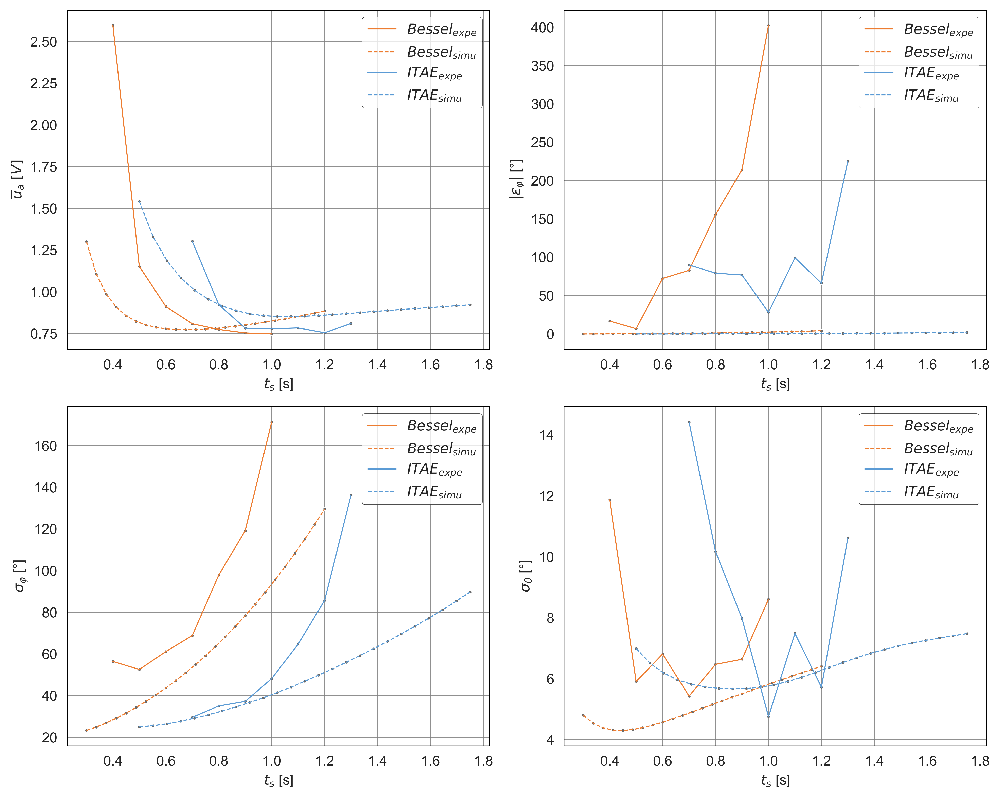

In [27]:
# Create a figure with 2x2 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=500)
sns.set_style("whitegrid")

# Plot each parameter on a separate subplot
for i in range(4):
    row, col = divmod(i, 2)
    plot_param(filesbessel,param_bessel_exp, i, axs[row, col] , colors[0], "${}_{{expe}}$".format(labels[0]))
    plot_param(tsbessel,param_bessel, i, axs[row, col] , colors[0], "${}_{{simu}}$".format(labels[0]), linestyle="--")
    plot_param(filesitae,param_itae_exp, i, axs[row, col] , colors[1], "${}_{{expe}}$".format(labels[1]))
    plot_param(tsitae,param_itae, i, axs[row, col] , colors[1], "${}_{{simu}}$".format(labels[1]), linestyle="--")
    
    # Customizing axes and plot border
    for spine in axs[row, col].spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')  # Set spines color to black
    
    # Customize legend
    legend = axs[row, col].legend(frameon=True)
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)      # Change the box's border width
    
    # Setting the style for grid lines
    axs[row, col].grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
    axs[row, col].minorticks_on()  # Turn on minor ticks

    axs[row, col].set_xlabel("$t_s$ [s]")
    axs[row, col].set_ylabel(metrics[i])

# Adjust layout
plt.tight_layout()

# Save and show plot
plt.savefig("plot/expeWithNoise.png", bbox_inches='tight')  
plt.show()

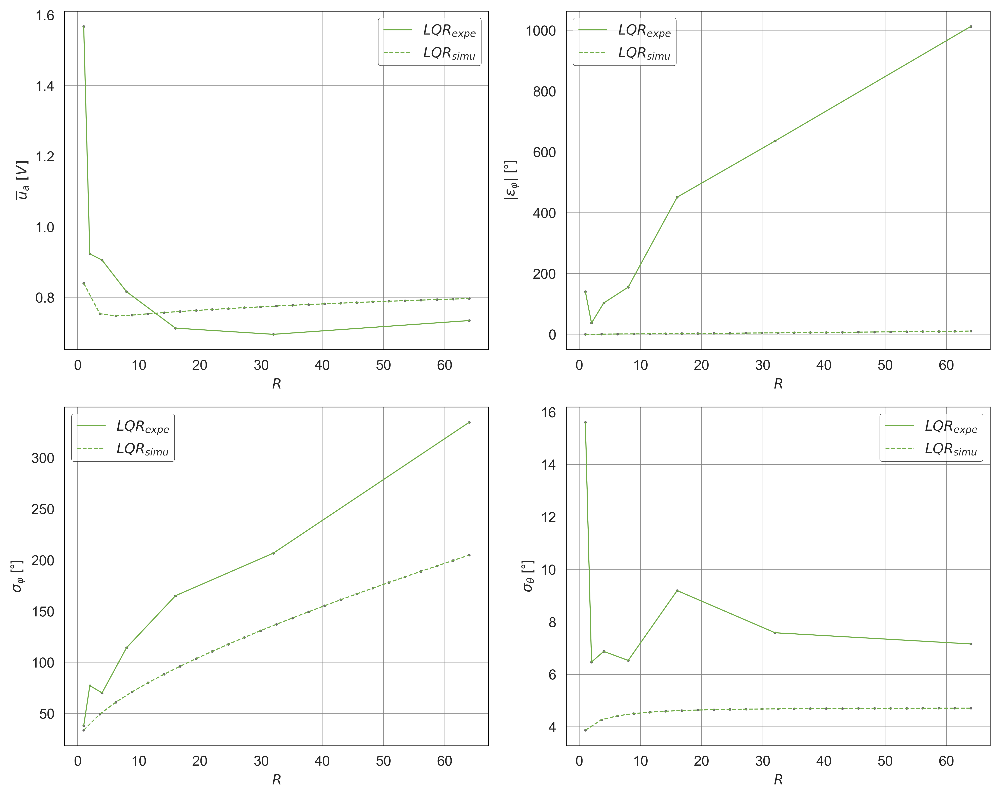

In [28]:
# Create a figure with 2x2 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=500)
sns.set_style("whitegrid")

# Plot each parameter on a separate subplot
for i in range(4):
    row, col = divmod(i, 2)
    plot_param(fileslqr,param_LQR_exp, i, axs[row, col] , colors[2], "${}_{{expe}}$".format(labels[2]))
    plot_param(costs,param_LQR, i, axs[row, col] , colors[2], "${}_{{simu}}$".format(labels[2]), linestyle="--")

    # Customizing axes and plot border
    for spine in axs[row, col].spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')  # Set spines color to black
    
    # Customize legend
    legend = axs[row, col].legend(frameon=True)
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)      # Change the box's border width
    
    # Setting the style for grid lines
    axs[row, col].grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
    axs[row, col].minorticks_on()  # Turn on minor ticks

    axs[row, col].set_xlabel("$R$")
    axs[row, col].set_ylabel(metrics[i])

# Adjust layout
plt.tight_layout()

# Save and show plot
plt.savefig("plot/protLQRparams.png", bbox_inches='tight')  
plt.show()

0.7 & 0.9 & 4 \\


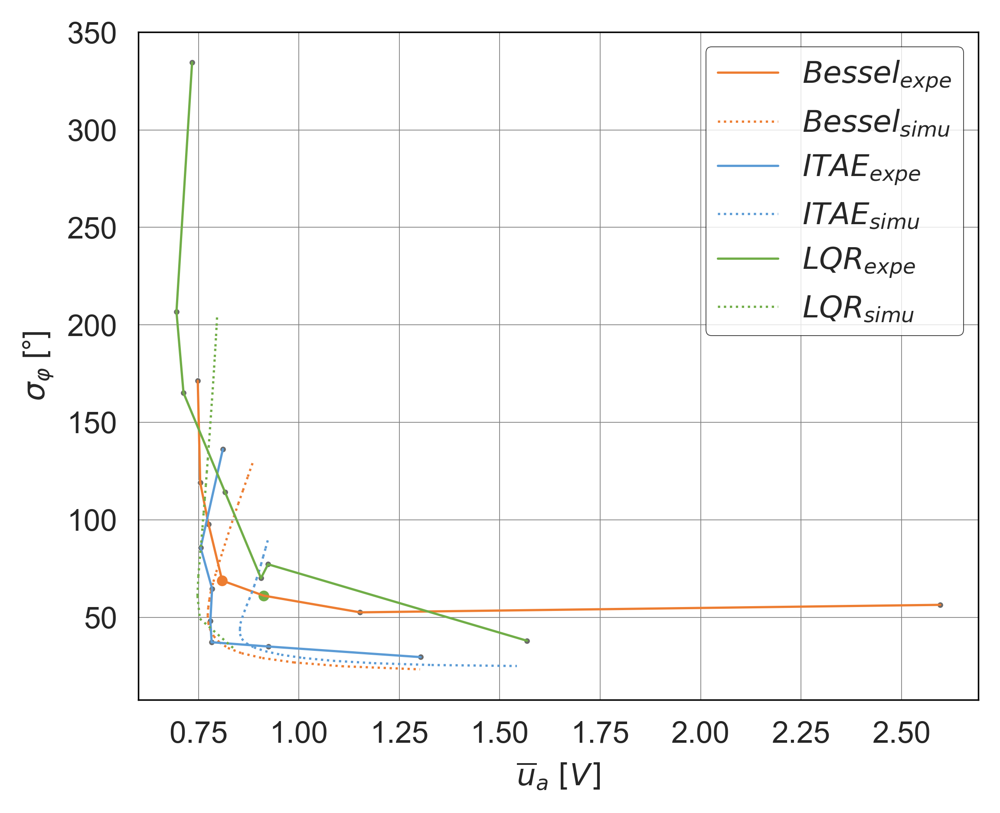

In [29]:
# Set up the figure
plt.figure(figsize=(5, 4), dpi=500)
sns.set_style("whitegrid")

# Define indices for plotting
index1, index2 = 0, 2

# Function to plot data segments
def plot_data_segments(param_exp, param_sim, color, label):
    plot_segments(param_exp, index1, index2, color, "${}_{{expe}}$".format(label))
    plot_segments(param_sim, index1, index2, color, "${}_{{simu}}$".format(label), linestyle=":", scatter=False)

# Plot data segments for Bessel, ITAE, and LQR controllers
plot_data_segments(param_bessel_exp, param_bessel, colors[0], labels[0])
plot_data_segments(param_itae_exp, param_itae, colors[1], labels[1])
plot_data_segments(param_LQR_exp, param_LQR, colors[2], labels[2])

# Find best experimental points
factor1, factor2 = 2.5, 300
best_points = {
    "Bessel": findBest(param_bessel_exp, index1, index2, factor1, factor2),
    "ITAE": findBest(param_itae_exp, index1, index2, factor1, factor2),
    "LQR": findBest(param_LQR_exp, index1, index2, factor1, factor2)
}

# Plot best experimental points
for label, color in zip(labels, colors):
    best_index = best_points[label]
    sns.scatterplot(x=[param_bessel_exp[best_index, index1]], y=[param_bessel_exp[best_index, index2]], marker="o", s=15, color=color)

print('{:.2g} & {:.2g} & {:.2g} \\\\'.format(filesbessel[best_points["Bessel"]], filesitae[best_points["ITAE"]], fileslqr[best_points["LQR"]]))

# Customizing axes and plot border
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(0.5)
    spine.set_color('black')

# Customize legend
legend = plt.legend(frameon=True)
legend_frame = legend.get_frame()
legend_frame.set_edgecolor('black')
legend_frame.set_linewidth(0.25)

# Setting the style for grid lines
plt.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
plt.minorticks_on()

# Set labels
plt.xlabel(metrics[index1])
plt.ylabel(metrics[index2])

# Save and show plot
plt.savefig("plot/ExpeControllerPerf1.png", bbox_inches='tight')
plt.show()